In [2]:
#! lamin init --storage ./lamin-intro --schema bionty

import scanpy as sc
from scprint import scPrint
from scdataloader import Preprocessor
from scdataloader.utils import load_genes
import lamindb as ln

from scprint.tasks import Embedder, find_coarser_labels, get_top_labels
import pandas as pd

%load_ext autoreload
%autoreload 2

import torch

torch.set_float32_matmul_precision("medium")

In [4]:
ln.Artifact.filter(key__contains="2025-02-25/h5ad/Velocyto/Sola")

<ArtifactQuerySet []>

In [3]:
# model_checkpoint_file = hf_hub_download(
#    repo_id="jkobject/scPRINT", filename=f"v2-medium.ckpt"
# )
# model_checkpoint_file = ../data/
LOC = "../"
model_checkpoint_file = f"{LOC}models/18hebyht-final-small.ckpt"
# w937u4o1 medium
# da6ao55o vae

In [3]:
model = scPrint.load_from_checkpoint(model_checkpoint_file, precpt_gene_emb=None)

FYI: scPrint is not attached to a `Trainer`.


# H show on an unseen species umap


In [5]:
col = (
    ln.Collection.using("laminlabs/arc-virtual-cell-atlas")
    .filter(key="scBaseCount/Velocyto/Solanum_lycopersicum")
    .one()
)
adata = col.artifacts.filter().first().load()

→ the database (1.12.1) is ahead of your installed lamindb package (1.6.2)
→ consider updating lamindb: pip install lamindb>=1.12
→ consider updating lamindb: pip install lamindb>=1.12
! run input wasn't tracked, call `ln.track()` and re-run


In [8]:
col.artifacts.filter().first().cache()

! run input wasn't tracked, call `ln.track()` and re-run


PosixUPath('/home/ml4ig1/.cache/lamindb/arc-scbasecount/2025-02-25/h5ad/Velocyto/Solanum_lycopersicum/SRX15090984.h5ad')

In [5]:
col.artifacts.filter().first()
#  The leaves of tomato plants were cut and immediately transferred into the enzyme solutionnby vacuum infiltration for 30 min. The samples were then protoplasted for 2 hours at 20℃ on an orbital shaker set at 200 g. Cells were then filtered with a 40 µm cell strainer.The WI solution was added and shaken vigorously to release the protoplasts. The protoplasts were collected by centrifugation at 200 g, and then washed with the WI solution after which the supernatant was removed by centrifugation. Cell activity was detected by trypan blue staining and cell concentration was measured with a hemocytometer. The scRNA-seq libraries were constructed using the Chromium Single Cell 3' Gel Beads-in-emulsion (GEM) Library & Gel Bead Kit v3.

Artifact(uid='SguOjtuJnjraGlSU0000', is_latest=True, key='2025-02-25/h5ad/Velocyto/Solanum_lycopersicum/SRX15090984.h5ad', suffix='.h5ad', kind='dataset', otype='AnnData', size=137496013, hash='DMNfZ6j4QuwHwNA5W9mQag', n_observations=13496, branch_id=1, space_id=1, storage_id=3, run_id=10, schema_id=47, created_by_id=1, created_at=2025-03-01 22:06:01 UTC)

In [4]:
LOC = "/pasteur/appa/scratch/jkalfon/data/"

In [ ]:
# or predownload it
# loc = col.artifacts.filter().first().cached()
adata = sc.read(LOC + "SRX15090984.h5ad")

In [6]:
adata.obs["organism_ontology_term_id"] = "NCBITaxon:4081"

In [12]:
preprocessor = Preprocessor(
    force_preprocess=True,
    skip_validate=True,
    do_postp=True,
    organisms="NCBITaxon:4081",
)
adata = preprocessor(adata.copy())
adata

Dropping layers:  KeysView(Layers with keys: )
checking raw counts
removed 0 non primary cells, 13493 renamining
filtered out 2 cells, 13491 renamining
Removed 0 genes not known to the ontology
Removed 0 duplicate genes
Added 0 genes in the ontology but not present in the dataset
starting QC
Seeing 591 outliers (4.38% of total dataset):
normalize
starting PCA
done
AnnData object with n_obs × n_vars = 13491 × 34429
    obs: 'gene_count', 'umi_count', 'SRX_accession', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches'
    var: 'gene_ids', 'feature_types', 'uid_x', 'symbol_x', 'biotype_x', 'organism_id_x', 'branch_id_x', 'mt_x', 'ribo_x', 'hb_x', 'organism_x'

AnnData object with n_obs × n_vars = 13491 × 34429
    obs: 'gene_count', 'umi_count', 'SRX_accession', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches'
    var: 'gene_ids', 'feature_types', 'uid_x', 'symbol_x', 'biotype_x', 'organism_id_x', 'branch_id_x', 'mt_x', 'ribo_x', 'hb_x', 'organism_x', 'ensembl_gene_id_x', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'uid_y', 'symbol_y', 'biotype_y', 'organism_id_y', 'branch_id_y', 'mt_y', 'ribo_y', 'hb_y', 'organism_y', 'ensembl_gene_id_y', 'uid', 'symbol', 'biotype', 'organism_id', 'branch_id', 'mt', 'ribo', 'hb', 'organism', 'ensembl_

/local/scratch/tmp/ipykernel_695998/1106675915.py:6: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.2, key_added="leiden_0.2")
... storing 'organism_ontology_term_id' as categorical
... storing 'batches' as categorical
... storing 'gene_ids' as categorical
... storing 'symbol_x' as categorical
... storing 'biotype_x' as categorical
... storing 'organism_x' as categorical
... storing 'symbol_y' as categorical
... storing 'biotype_y' as categorical
... storing 'organism_y' as categorical
... storing 'symbol' as categorical
... storing 'biotype' as categorical
... storing 'organism' as categorical


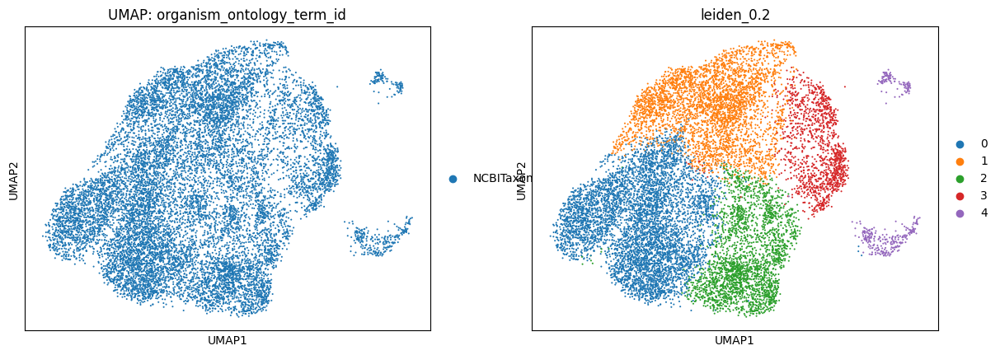

In [13]:
# Standard Scanpy preprocessing
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# If clustering not already done, perform Leiden clustering
sc.tl.leiden(adata, resolution=0.2, key_added="leiden_0.2")

# Plot UMAP
sc.pl.umap(
    adata,
    color=["organism_ontology_term_id", "leiden_0.2"],
    title="UMAP: organism_ontology_term_id",
)

In [ ]:
# cluster 0 is chlorophyl and chloroplasts: Young chloroplast-rich mesophyll []
# cluster 1 is the rest of  [RING-type E3 ubiquitin transferase, Blue copper protein, S-adenosylmethionine-dependent methyltransferase, Kunitz-type trypsin inhibitor]
# cluster 2 is [GDSL-motif esterase/acyltransferase/lipase, Putative E3 ubiquitin-protein ligase PUB23, same, phospho lipid membrane status, regulator of heat stress]

In [ ]:
# Find the 3 largest clusters
cluster_counts = sadata.obs["leiden_0.2"].value_counts().sort_values(ascending=False)
top3_clusters = cluster_counts.index[:3].tolist()

print("Top 3 clusters:", top3_clusters)

# Subset adata to only cells in the top 3 clusters
adata_top3 = sadata[sadata.obs["leiden_0.2"].isin(top3_clusters)].copy()

# Perform pairwise differential expression between the 3 clusters
de_results = {}
for i in range(3):
    group1 = top3_clusters[i]
    key = f"{group1}"
    print(f"Computing DE: {group1}")
    sc.tl.rank_genes_groups(
        adata_top3,
        groupby="leiden_0.2",
        groups=[group1],
        reference="rest",
        method="wilcoxon",
        n_genes=25,
    )
    # Store results
    result = adata_top3.uns["rank_genes_groups"]
    de_df = pd.DataFrame(
        {
            "names": result["names"][group1],
            "scores": result["scores"][group1],
            "logfoldchanges": result["logfoldchanges"][group1],
            "pvals_adj": result["pvals_adj"][group1],
        }
    )
    de_results[key] = de_df
    print(de_df.head())

# Optionally, plot top DE genes for each comparison
for key, df in de_results.items():
    print(f"\nTop DE genes for {key}:")
    display(df.head(10))

Top 3 clusters: ['0', '1', '2']
Computing DE: 0


/home/ml4ig1/Documents code/scPRINT/.venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


            names     scores  logfoldchanges  pvals_adj
0  Solyc07g066150  69.643456             NaN        0.0
1  Solyc03g005760  58.649540             NaN        0.0
2  Solyc09g092110  53.050755             NaN        0.0
3  Solyc11g022590  48.993259             NaN        0.0
4  Solyc07g043390  41.217999             NaN        0.0
Computing DE: 1


/home/ml4ig1/Documents code/scPRINT/.venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


            names     scores  logfoldchanges  pvals_adj
0  Solyc11g006030  62.652084             NaN        0.0
1  Solyc03g116700  60.453167             NaN        0.0
2  Solyc04g040180  55.739494             NaN        0.0
3  Solyc03g098740  50.202190             NaN        0.0
4  Solyc02g071130  49.610603             NaN        0.0
Computing DE: 2
            names     scores  logfoldchanges      pvals_adj
0  Solyc02g071610  41.929047             NaN   0.000000e+00
1  Solyc01g007020  33.377884             NaN  1.913811e-241
2  Solyc01g007010  31.584755             NaN  2.989625e-216
3  Solyc10g005330  27.181450             NaN  2.690704e-160
4  Solyc10g081570  23.874083             NaN  8.760564e-124

Top DE genes for 0:


/home/ml4ig1/Documents code/scPRINT/.venv/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


,names,scores,logfoldchanges,pvals_adj
0,Solyc07g066150,69.643456,NaN,0.000000e+00
1,Solyc03g005760,58.649540,NaN,0.000000e+00
2,Solyc09g092110,53.050755,NaN,0.000000e+00
3,Solyc11g022590,48.993259,NaN,0.000000e+00
4,Solyc07g043390,41.217999,NaN,0.000000e+00
5,Solyc09g089505,40.655720,NaN,0.000000e+00
6,Solyc09g084465,36.719292,NaN,2.996027e-293
7,Solyc09g083440,35.765305,NaN,2.638496e-278
8,Solyc03g005770,32.936047,NaN,3.723058e-236
9,Solyc12g006470,28.825891,NaN,4.517197e-181



Top DE genes for 1:


,names,scores,logfoldchanges,pvals_adj
0,Solyc11g006030,62.652084,NaN,0.0
1,Solyc03g116700,60.453167,NaN,0.0
2,Solyc04g040180,55.739494,NaN,0.0
3,Solyc03g098740,50.202190,NaN,0.0
4,Solyc02g071130,49.610603,NaN,0.0
5,Solyc01g099680,48.931545,NaN,0.0
6,Solyc05g008120,47.576286,NaN,0.0
7,Solyc01g109120,47.338757,NaN,0.0
8,Solyc12g056250,44.930500,NaN,0.0
9,Solyc01g081310,44.254253,NaN,0.0



Top DE genes for 2:


,names,scores,logfoldchanges,pvals_adj
0,Solyc02g071610,41.929047,NaN,0.000000e+00
1,Solyc01g007020,33.377884,NaN,1.913811e-241
2,Solyc01g007010,31.584755,NaN,2.989625e-216
3,Solyc10g005330,27.181450,NaN,2.690704e-160
4,Solyc10g081570,23.874083,NaN,8.760564e-124
5,Solyc09g091100,23.175959,NaN,1.061234e-116
6,Solyc08g068150,22.897488,NaN,5.790523e-114
7,Solyc07g056320,20.328062,NaN,8.068230e-90
8,Solyc09g083290,18.452841,NaN,4.497665e-74
9,Solyc03g116100,18.382923,NaN,1.565259e-73


In [8]:
LOC2 = "./"  # "../../"
model.add_organism(
    "NCBITaxon:4081",
    emb=pd.read_parquet(LOC2 + "data/main/gene_embs/solanum_emb.parquet"),
    genes=load_genes("NCBITaxon:4081"),
    locs=pd.read_parquet(LOC2 + "data/main/gene_locs/solanum.parquet"),
)

In [10]:
embed = Embedder(
    how="random expr",
    max_len=2800,
    num_workers=16,
    pred_embedding=["cell_type_ontology_term_id"],
)

/pasteur/appa/homes/jkalfon/scdataloader/scdataloader/utils.py:427: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  organismdf = pd.concat(organismdf)


not on wandb, could not set name


100%|██████████| 211/211 [00:28<00:00,  7.51it/s]


logging the anndata
AnnData object with n_obs × n_vars = 13491 × 23948
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'pred_cell_culture', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_tissue_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_age_group', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'
    obsm: 'scprint_emb_cell_type_ontology_term_id'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'


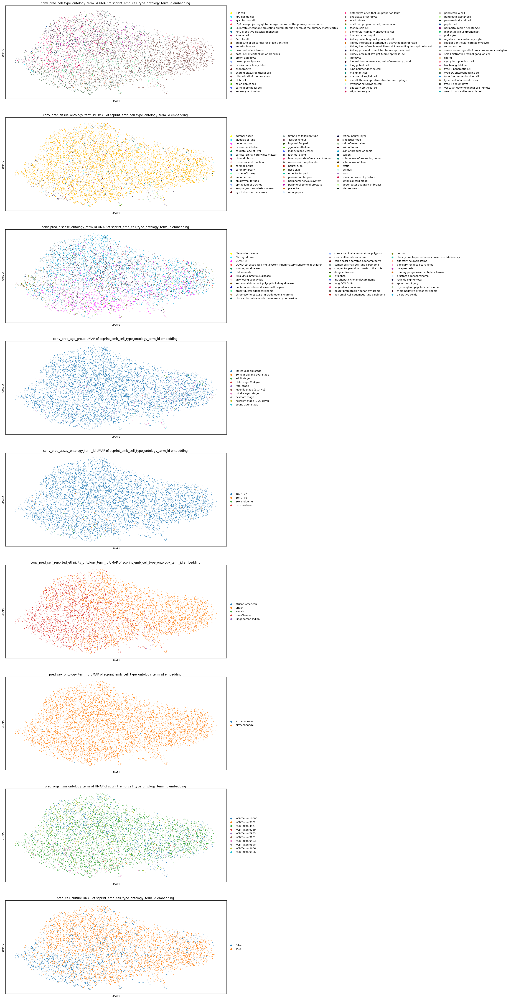

couldn't log to tensorboard
couldn't log to wandb
too few cells to compute a clustering
true label NCBITaxon:4081 not in available classes


In [14]:
# cell type
n_adata, metrics = embed(model, adata.copy())

In [16]:
n_adata.obs.pred_organism_ontology_term_id.value_counts()

pred_organism_ontology_term_id
NCBITaxon:4577     8745
NCBITaxon:10090    2465
NCBITaxon:9606     1217
NCBITaxon:9483      448
NCBITaxon:9598      312
NCBITaxon:3702      200
NCBITaxon:6239       84
NCBITaxon:9031       12
NCBITaxon:9986        7
NCBITaxon:7955        1
Name: count, dtype: int64

In [18]:
n_adata.obs.shape

(13491, 40)

In [19]:
9000 / 13500

0.6666666666666666

In [20]:
n_adata.obs.pred_cell_type_ontology_term_id.value_counts()

pred_cell_type_ontology_term_id
CL:1000839    4532
CL:0000706    1938
CL:1000347    1399
CL:1000342    1321
CL:0000577     969
              ... 
CL:0002335       1
CL:0000513       1
CL:0000604       1
CL:0000765       1
CL:0000019       1
Name: count, Length: 66, dtype: int64

In [21]:
n_adata.obs.pred_tissue_ontology_term_id.value_counts()

pred_tissue_ontology_term_id
UBERON:0000473    11005
UBERON:0001817      536
UBERON:8410010      519
UBERON:0002299      305
UBERON:0001987      270
UBERON:0012168      110
UBERON:0018131       79
UBERON:0014614       66
UBERON:0002489       62
UBERON:0005969       58
UBERON:0010412       49
UBERON:0000002       49
UBERON:0001886       47
UBERON:0000400       42
UBERON:0004648       36
UBERON:0000010       28
UBERON:0002351       23
UBERON:0001049       19
UBERON:0002106       18
UBERON:0005636       17
UBERON:0001459       14
UBERON:0001117       13
UBERON:0001388       13
UBERON:0010414       13
UBERON:8410026       10
UBERON:0006761        9
UBERON:0001295        9
UBERON:0035328        8
UBERON:0002372        7
UBERON:0002370        7
UBERON:0001901        7
UBERON:0001471        6
UBERON:0010410        6
UBERON:0003902        5
UBERON:0003517        4
UBERON:0003403        4
UBERON:0001621        3
UBERON:0004929        3
UBERON:0001225        2
UBERON:0002509        2
UBERON:0002

In [15]:
model.organisms

['NCBITaxon:10090',
 'NCBITaxon:10181',
 'NCBITaxon:3702',
 'NCBITaxon:4577',
 'NCBITaxon:6239',
 'NCBITaxon:7227',
 'NCBITaxon:7955',
 'NCBITaxon:9031',
 'NCBITaxon:9483',
 'NCBITaxon:9544',
 'NCBITaxon:9598',
 'NCBITaxon:9606',
 'NCBITaxon:9823',
 'NCBITaxon:9913',
 'NCBITaxon:9940',
 'NCBITaxon:9986',
 'NCBITaxon:4081']

# extract labels at different resolutions based on certainties

- do a top-k of cell type labels for some cells.
- find an interesting one for a group of cells
- create a function to extract the coarse label that discriminates the most
  between the top-k


In [ ]:
embed = Embedder(
    how="random expr",
    max_len=4000,
    num_workers=16,
    pred_embedding=["cell_type_ontology_term_id"],
    keep_all_labels_pred=True,
)

In [ ]:
# cell type
import random

# Set a seed for reproducibility
random.seed(42)

# Randomly sample 1000 indices from the dataset
random_indices = random.sample(range(len(adata)), 1000)

# Use the random sample to select data
daa, metrics = embed(model, adata.copy()[random_indices], cache=False)

not on wandb, could not set name


100%|██████████| 2/2 [00:01<00:00,  1.02it/s]


logging the anndata
AnnData object with n_obs × n_vars = 100 × 368879
    obsm: 'scprint_emb'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'
too few cells to embed into a umap
too few cells to compute a clustering


In [49]:
get_top_labels(model, daa)

,cell_type_ontology_term_id,cell_type_ontology_term_id_certainty,cell_type_ontology_term_id_choice1,cell_type_ontology_term_id_choice2,tissue_ontology_term_id,tissue_ontology_term_id_certainty,tissue_ontology_term_id_choice1,tissue_ontology_term_id_choice2,disease_ontology_term_id,disease_ontology_term_id_certainty,disease_ontology_term_id_choice1,disease_ontology_term_id_choice2,age_group,age_group_certainty,age_group_choice1,age_group_choice2,assay_ontology_term_id,assay_ontology_term_id_certainty,assay_ontology_term_id_choice1,assay_ontology_term_id_choice2,self_reported_ethnicity_ontology_term_id,self_reported_ethnicity_ontology_term_id_certainty,self_reported_ethnicity_ontology_term_id_choice1,self_reported_ethnicity_ontology_term_id_choice2,sex_ontology_term_id,organism_ontology_term_id,organism_ontology_term_id_certainty,organism_ontology_term_id_choice1,organism_ontology_term_id_choice2,cell_culture
13f68fbd-1a0e-4f98-a610-cb82a5840605,CL:1000839,-0.421143,None,None,UBERON:0002299,0.427734,None,None,MONDO:0003210,-0.668945,None,None,HsapDv:0000272,-0.128540,None,None,EFO:0009922,4.351562,None,None,HANCESTRO:0462,0.540039,None,None,PATO:0000384,NCBITaxon:10090,13.156250,None,None,False
dfd742e5-39bd-42b8-ba23-7886cd7a0b39,CL:1000839,-0.462646,None,None,UBERON:0002299,-0.043762,None,None,PATO:0000461,-0.256348,None,None,HsapDv:0000272,0.366455,None,None,EFO:0009922,3.097656,None,None,HANCESTRO:0462,0.449951,None,None,PATO:0000384,NCBITaxon:10090,12.804688,None,None,False
184cbbff-b2f7-4abf-bd11-53776177fd93,CL:4033042,-1.078125,CL:0000912,CL:1000839,UBERON:0002299,0.262207,None,None,PATO:0000461,-1.261719,None,None,HsapDv:0000272,2.427734,None,None,EFO:0009922,5.171875,None,None,HANCESTRO:0462,2.324219,None,None,PATO:0000384,NCBITaxon:10090,13.476562,None,None,False
9030977a-ac71-48d4-b1ff-fceeef26bf9f,CL:1000839,0.078247,None,None,UBERON:0002299,0.280518,None,None,PATO:0000461,-0.908203,None,None,HsapDv:0000272,1.451172,None,None,EFO:0009922,3.181641,None,None,HANCESTRO:0462,1.883789,None,None,PATO:0000384,NCBITaxon:10090,12.906250,None,None,False
ec1439bb-d1b5-470f-8ff4-d772fb941360,CL:1000839,0.006889,None,None,UBERON:0002299,0.547363,None,None,PATO:0000461,-0.761230,MONDO:0003438,None,HsapDv:0000272,3.214844,None,None,EFO:0009922,4.789062,None,None,HANCESTRO:0462,2.271484,None,None,PATO:0000384,NCBITaxon:10090,12.070312,None,None,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
dddf31dd-564f-488f-a3eb-2b279fd1f1da,CL:1000839,0.737793,None,None,UBERON:0001117,0.181519,None,None,PATO:0000461,-1.078125,None,None,HsapDv:0000272,2.408203,None,None,EFO:0009922,4.539062,None,None,HANCESTRO:0027,1.138672,None,None,PATO:0000384,NCBITaxon:9598,-4.273438,None,None,False
ba534797-8e3b-4c47-be63-6d3daf9a517e,CL:1000839,0.705078,None,None,UBERON:0002299,0.898926,None,None,MONDO:0003438,-1.178711,PATO:0000461,MONDO:0018874,HsapDv:0000266,0.045898,None,None,EFO:0009922,4.250000,None,None,HANCESTRO:0027,-0.267578,None,None,PATO:0000384,NCBITaxon:10090,12.851562,None,None,False
79c2e8c1-8fec-4437-ae5d-8eb1ea215c7f,CL:1000839,-0.007034,None,None,UBERON:0001117,-0.043152,None,None,MONDO:0006329,-1.141602,None,None,HsapDv:0000266,0.569824,None,None,EFO:0009922,4.781250,None,None,HANCESTRO:0462,2.615234,None,None,PATO:0000384,NCBITaxon:10090,12.812500,None,None,False
83e31ffe-826e-418a-a8d5-a5f2f1d2e7d3,CL:1000839,-0.322510,None,None,UBERON:0002299,0.276367,None,None,PATO:0000461,0.012344,None,None,HsapDv:0000267,0.800781,None,None,EFO:0030059,-1.020508,EFO:0009922,None,HANCESTRO:0027,6.339844,None,None,PATO:0000384,NCBITaxon:9606,10.726562,None,None,False


In [ ]:
daa.obs.iloc[:, -18:-2].mean(0).sort_values(ascending=False)

NCBITaxon: 9031

NCBITaxon:10090      8.59375
NCBITaxon:7227     -17.68750
NCBITaxon:9606     -32.06250
NCBITaxon:9031     -88.31250
NCBITaxon:6239     -88.37500
NCBITaxon:9483     -89.81250
NCBITaxon:7955     -98.00000
NCBITaxon:9544     -99.81250
NCBITaxon:9986    -102.37500
NCBITaxon:9598    -112.75000
NCBITaxon:3702    -112.87500
NCBITaxon:4577    -113.93750
NCBITaxon:9823    -117.25000
NCBITaxon:10181   -118.37500
NCBITaxon:9913    -119.50000
NCBITaxon:9940    -124.06250
dtype: float16

In [40]:
_[~_["organism_ontology_term_id_choice1"].isna()]

,cell_type_ontology_term_id,cell_type_ontology_term_id_certainty,cell_type_ontology_term_id_choice1,cell_type_ontology_term_id_choice2,tissue_ontology_term_id,tissue_ontology_term_id_certainty,tissue_ontology_term_id_choice1,tissue_ontology_term_id_choice2,disease_ontology_term_id,disease_ontology_term_id_certainty,disease_ontology_term_id_choice1,disease_ontology_term_id_choice2,age_group,age_group_certainty,age_group_choice1,age_group_choice2,assay_ontology_term_id,assay_ontology_term_id_certainty,assay_ontology_term_id_choice1,assay_ontology_term_id_choice2,self_reported_ethnicity_ontology_term_id,self_reported_ethnicity_ontology_term_id_certainty,self_reported_ethnicity_ontology_term_id_choice1,self_reported_ethnicity_ontology_term_id_choice2,sex_ontology_term_id,organism_ontology_term_id,organism_ontology_term_id_certainty,organism_ontology_term_id_choice1,organism_ontology_term_id_choice2,cell_culture


In [36]:
find_coarser_labels(_, model)

{'cell_type_ontology_term_id': {2: 'CL:0000235',
  3: 'CL:0000066',
  4: 'CL:1000497',
  6: 'CL:0000235',
  7: 'CL:0000066',
  8: 'CL:0000239',
  10: 'CL:1000497'},
 'tissue_ontology_term_id': {0: 'UBERON:0009912',
  1: 'UBERON:0009912',
  2: 'UBERON:0005177',
  3: 'UBERON:0009912',
  4: 'UBERON:0009912',
  5: 'UBERON:0000062',
  6: 'UBERON:0000062'},
 'disease_ontology_term_id': {7: 'MONDO:0700096'},
 'age_group': {0: 'HsapDv:0000258'},
 'assay_ontology_term_id': {0: 'EFO:0008995'},
 'self_reported_ethnicity_ontology_term_id': {}}

In [152]:
relabel

{'cell_type_ontology_term_id': {1: 'CL:0000066',
  2: 'CL:0000239',
  3: 'CL:0000239',
  4: 'CL:0000066',
  5: 'CL:0000066'},
 'tissue_ontology_term_id': {},
 'disease_ontology_term_id': {},
 'age_group': {},
 'assay_ontology_term_id': {},
 'self_reported_ethnicity_ontology_term_id': {},
 'organism_ontology_term_id': {}}

# H show on an unseen species umap


In [ ]:
# Solanum_lycopersicum
# Gorilla gorilla
# Equus caballus

In [9]:
col = (
    ln.Collection.using("laminlabs/arc-virtual-cell-atlas")
    .filter(key="scBaseCount/Velocyto/Equus_caballus")
    .one()
)
adata = col.artifacts.filter().first().load()

! run input wasn't tracked, call `ln.track()` and re-run


In [42]:
col.artifacts.filter().first()
# Synovial fluid (5 to 10 mL) was sampled from the affected middle carpal joint (osteoarthritic sample) and tibiotarsal joint (normal sample). Synoviocenteses to obtain synovial fluid were performed implementing aseptic technique using sterile gloves, needles (20 gauge, 1.5 inches), and syringes (23)

Artifact(uid='7MzMEivZt8dXoJtX0000', is_latest=True, key='2025-02-25/h5ad/Velocyto/Equus_caballus/SRX23498637.h5ad', suffix='.h5ad', kind='dataset', otype='AnnData', size=216723043, hash='ZSBk98PLgB0yWOoT/jMGwQ', n_observations=9352, branch_id=1, space_id=1, storage_id=3, run_id=10, schema_id=38, created_by_id=1, created_at=2025-03-01 22:00:04 UTC)

In [14]:
col.artifacts.filter().first().cache()

! run input wasn't tracked, call `ln.track()` and re-run


PosixUPath('/home/ml4ig1/.cache/lamindb/arc-scbasecount/2025-02-25/h5ad/Velocyto/Equus_caballus/SRX23498637.h5ad')

In [25]:
adata = sc.read(LOC + "SRX23498637.h5ad")

In [21]:
adata.obs["organism_ontology_term_id"] = "NCBITaxon:9796"

In [27]:
preprocessor = Preprocessor(
    force_preprocess=True,
    skip_validate=True,
    do_postp=True,
    organisms="NCBITaxon:9796",
)
adata = preprocessor(adata.copy())
adata

Dropping layers:  KeysView(Layers with keys: ambiguous, spliced, unspliced)
checking raw counts
removed 0 non primary cells, 9352 renamining
filtered out 11 cells, 9341 renamining
Removed 16198 genes not known to the ontology
Removed 0 duplicate genes
Added 16198 genes in the ontology but not present in the dataset
starting QC
Seeing 527 outliers (5.64% of total dataset):
normalize
starting PCA
done
AnnData object with n_obs × n_vars = 9341 × 36634
    obs: 'gene_count', 'umi_count', 'SRX_accession', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches'
    var: 'gene_ids', 'feature_types', 'uid', 'symbol', 'biotype', 'organism_id', 'branch_id', 'mt', 'ribo',

AnnData object with n_obs × n_vars = 9341 × 36634
    obs: 'gene_count', 'umi_count', 'SRX_accession', 'organism_ontology_term_id', 'nnz', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'batches'
    var: 'gene_ids', 'feature_types', 'uid', 'symbol', 'biotype', 'organism_id', 'branch_id', 'mt', 'ribo', 'hb', 'organism', 'ensembl_gene_id', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'unseen_genes'
    obsm: 'X_pca'
    layers: 'norm'

... storing 'organism_ontology_term_id' as categorical
... storing 'batches' as categorical
... storing 'gene_ids' as categorical
... storing 'symbol' as categorical
... storing 'biotype' as categorical
... storing 'organism' as categorical


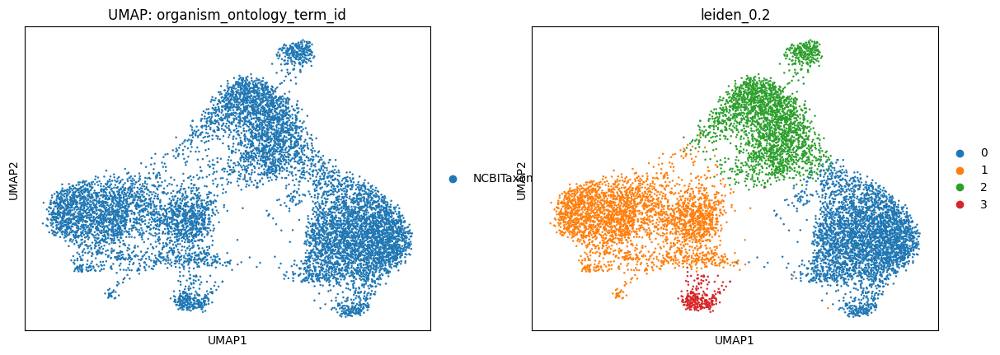

In [28]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# If clustering not already done, perform Leiden clustering
sc.tl.leiden(adata, resolution=0.2, key_added="leiden_0.2")

# Plot UMAP
sc.pl.umap(
    adata,
    color=["organism_ontology_term_id", "leiden_0.2"],
    title="UMAP: organism_ontology_term_id",
)

In [ ]:
# Find the 3 largest clusters
cluster_counts = sadata.obs["leiden_0.2"].value_counts().sort_values(ascending=False)
top3_clusters = cluster_counts.index[:3].tolist()

print("Top 3 clusters:", top3_clusters)

# Subset sadata to only cells in the top 3 clusters
sadata_top3 = sadata[sadata.obs["leiden_0.2"].isin(top3_clusters)].copy()

# Perform pairwise differential expression between the 3 clusters
de_results = {}
for i in range(3):
    group1 = top3_clusters[i]
    key = f"{group1}"
    print(f"Computing DE: {group1}")
    sc.tl.rank_genes_groups(
        sadata_top3,
        groupby="leiden_0.2",
        groups=[group1],
        reference="rest",
        method="wilcoxon",
        n_genes=25,
    )
    # Store results
    result = sadata_top3.uns["rank_genes_groups"]
    de_df = pd.DataFrame(
        {
            "names": result["names"][group1],
            "scores": result["scores"][group1],
            "logfoldchanges": result["logfoldchanges"][group1],
            "pvals_adj": result["pvals_adj"][group1],
        }
    )
    de_results[key] = de_df
    print(de_df.head())

# Optionally, plot top DE genes for each comparison
for key, df in de_results.items():
    print(f"\nTop DE genes for {key}:")
    display(df.head(10))

Top 3 clusters: ['0', '1', '2']
Computing DE: 0
                names     scores  logfoldchanges  pvals_adj
0  ENSECAG00000060247  50.428768       11.560231        0.0
1  ENSECAG00000055511  47.845623        6.439557        0.0
2  ENSECAG00000017042  44.741432        6.138793        0.0
3  ENSECAG00000024790  44.437943       48.745537        0.0
4  ENSECAG00000022247  42.490501        6.308612        0.0
Computing DE: 1
                names     scores  logfoldchanges      pvals_adj
0  ENSECAG00000055947  61.952080        9.886561   0.000000e+00
1  ENSECAG00000000419  55.360012        7.241366   0.000000e+00
2  ENSECAG00000038584  31.117973        3.809062  2.965641e-209
3  ENSECAG00000014696  29.514397        2.790389  3.446647e-188
4  ENSECAG00000039848  26.160618        1.882772  1.012514e-147
Computing DE: 2
                names     scores  logfoldchanges      pvals_adj
0  ENSECAG00000050689  28.072422       23.265644  7.794005e-169
1  ENSECAG00000039383  27.979254       22.476177

,names,scores,logfoldchanges,pvals_adj
0,ENSECAG00000060247,50.428768,11.560231,0.000000e+00
1,ENSECAG00000055511,47.845623,6.439557,0.000000e+00
2,ENSECAG00000017042,44.741432,6.138793,0.000000e+00
3,ENSECAG00000024790,44.437943,48.745537,0.000000e+00
4,ENSECAG00000022247,42.490501,6.308612,0.000000e+00
5,ENSECAG00000024886,39.551640,8.811050,0.000000e+00
6,ENSECAG00000033857,39.187336,4.958195,0.000000e+00
7,ENSECAG00000016578,38.836727,3.505301,0.000000e+00
8,ENSECAG00000019585,38.315022,5.036363,0.000000e+00
9,ENSECAG00000035431,33.804405,4.223828,4.788232e-247



Top DE genes for 1:


,names,scores,logfoldchanges,pvals_adj
0,ENSECAG00000055947,61.952080,9.886561,0.000000e+00
1,ENSECAG00000000419,55.360012,7.241366,0.000000e+00
2,ENSECAG00000038584,31.117973,3.809062,2.965641e-209
3,ENSECAG00000014696,29.514397,2.790389,3.446647e-188
4,ENSECAG00000039848,26.160618,1.882772,1.012514e-147
5,ENSECAG00000058951,26.154930,3.046530,1.133242e-147
6,ENSECAG00000054519,24.053141,2.768748,8.860270e-125
7,ENSECAG00000047697,23.250021,4.381759,1.531996e-116
8,ENSECAG00000022992,21.813786,4.611201,1.497321e-102
9,ENSECAG00000034339,21.509260,1.031662,1.086417e-99



Top DE genes for 2:


,names,scores,logfoldchanges,pvals_adj
0,ENSECAG00000050689,28.072422,23.265644,7.794005e-169
1,ENSECAG00000039383,27.979254,22.476177,5.323016e-168
2,ENSECAG00000017143,27.769135,201.395798,1.250099e-165
3,ENSECAG00000044086,27.167072,14.185330,1.457623e-158
4,ENSECAG00000029928,26.921156,26.182762,9.099197e-156
5,ENSECAG00000009142,26.080042,9.028623,3.749690e-146
6,ENSECAG00000043792,25.940327,13.749592,1.223537e-144
7,ENSECAG00000009190,25.866550,529.418640,7.258105e-144
8,ENSECAG00000020699,25.836338,23.148275,1.410472e-143
9,ENSECAG00000045439,25.561808,82.143929,1.486833e-140


In [ ]:
# cluster 0 is chlorophyl and chloroplasts: Young chloroplast-rich mesophyll []
# cluster 1 is the rest of  [RING-type E3 ubiquitin transferase, Blue copper protein, S-adenosylmethionine-dependent methyltransferase, Kunitz-type trypsin inhibitor]
# cluster 2 is [GDSL-motif esterase/acyltransferase/lipase, Putative E3 ubiquitin-protein ligase PUB23, same, phospho lipid membrane status, regulator of heat stress]

In [31]:
LOC

'/pasteur/appa/scratch/jkalfon/data/'

In [ ]:
model.add_organism(
    "NCBITaxon:9796",
    emb=pd.read_parquet(LOC2 + "data/main/gene_embs/equus_emb.parquet"),
    genes=load_genes("NCBITaxon:9796"),
    locs=pd.read_parquet(LOC2 + "data/main/gene_locs/equus.parquet"),
)

In [33]:
embed = Embedder(
    how="random expr",
    max_len=2800,
    num_workers=16,
    pred_embedding=["cell_type_ontology_term_id"],
)

/pasteur/appa/homes/jkalfon/scdataloader/scdataloader/utils.py:427: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  organismdf = pd.concat(organismdf)


not on wandb, could not set name


100%|██████████| 146/146 [00:19<00:00,  7.35it/s]


logging the anndata
AnnData object with n_obs × n_vars = 9341 × 6048
    obs: 'pred_cell_type_ontology_term_id', 'pred_tissue_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_age_group', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'pred_cell_culture', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_tissue_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_age_group', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'
    obsm: 'scprint_emb_cell_type_ontology_term_id'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'


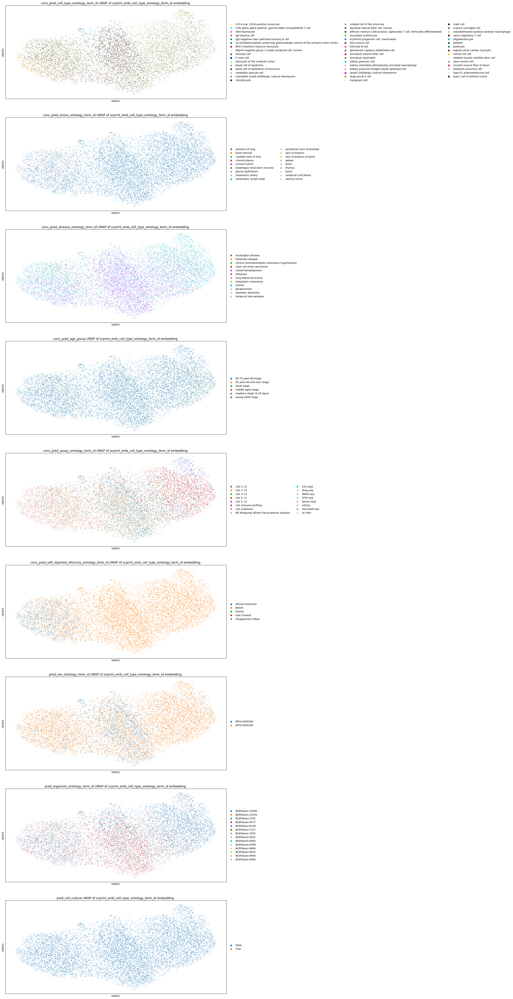

couldn't log to tensorboard
couldn't log to wandb
too few cells to compute a clustering
true label NCBITaxon:9796 not in available classes


In [34]:
# cell type
n_adata, metrics = embed(model, adata.copy())

In [35]:
n_adata.obs.pred_organism_ontology_term_id.value_counts()

pred_organism_ontology_term_id
NCBITaxon:10090    4768
NCBITaxon:4577     2420
NCBITaxon:9606      844
NCBITaxon:9598      599
NCBITaxon:9031      160
NCBITaxon:9483      139
NCBITaxon:6239      127
NCBITaxon:10181      99
NCBITaxon:9986       96
NCBITaxon:3702       59
NCBITaxon:9823       14
NCBITaxon:7955        9
NCBITaxon:7227        4
NCBITaxon:9940        3
Name: count, dtype: int64

In [38]:
n_adata.shape

(9341, 36634)

In [1]:
(9341 - 2620) / 9341

0.7195161117653356

In [30]:
n_adata.obs.pred_organism_ontology_term_id.value_counts()

pred_organism_ontology_term_id
NCBITaxon:9606     6589
NCBITaxon:10090    2055
NCBITaxon:4577      298
NCBITaxon:9823      221
NCBITaxon:9544       69
NCBITaxon:9986       43
NCBITaxon:9483       38
NCBITaxon:10181      14
NCBITaxon:9940       14
Name: count, dtype: int64

In [32]:
embed = Embedder(
    how="random expr",
    max_len=4000,
    num_workers=16,
    pred_embedding=["cell_type_ontology_term_id"],
    keep_all_labels_pred=True,
)
n_adata, metrics = embed(model, adata.copy())

not on wandb, could not set name


100%|██████████| 146/146 [03:22<00:00,  1.39s/it]


logging the anndata
AnnData object with n_obs × n_vars = 9341 × 21426
    obsm: 'scprint_emb_cell_type_ontology_term_id'
    layers: 'scprint_mu', 'scprint_theta', 'scprint_pi'
too few cells to embed into a umap
too few cells to compute a clustering


# extract labels at different resolutions based on certainties

- do a top-k of cell type labels for some cells.
- find an interesting one for a group of cells
- create a function to extract the coarse label that discriminates the most
  between the top-k


In [33]:
res = get_top_labels(model, n_adata)

array([140128,  17216,  72176,  97856,  82288, 142304,  39312,  66496,
       134720,   9680])

In [ ]:
n_adata.obs.columns.str.contains("NCBITaxon").sum()

np.int64(16)

In [ ]:
[
    n_adata.obs.columns[n_adata.obs.columns.str.contains("NCBITaxon")][i % 16]
    for i in n_adata.obs.iloc[:, n_adata.obs.columns.str.contains("NCBITaxon")]
    .values.flatten()
    .argsort()[::-1][:10]
]

['NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090',
 'NCBITaxon:10090']

In [34]:
res[
    ~res.organism_ontology_term_id_choice1.isna()
].organism_ontology_term_id.value_counts()

organism_ontology_term_id
NCBITaxon:9606     77
NCBITaxon:10090    55
NCBITaxon:9823     42
NCBITaxon:4577     23
NCBITaxon:10181    15
NCBITaxon:9544      8
NCBITaxon:9986      5
NCBITaxon:9483      3
NCBITaxon:9940      1
Name: count, dtype: int64

In [36]:
res

/home/ml4ig1/Documents code/scPRINT/.venv/lib/python3.11/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()


,cell_type_ontology_term_id,cell_type_ontology_term_id_certainty,cell_type_ontology_term_id_choice1,cell_type_ontology_term_id_choice2,tissue_ontology_term_id,tissue_ontology_term_id_certainty,tissue_ontology_term_id_choice1,tissue_ontology_term_id_choice2,disease_ontology_term_id,disease_ontology_term_id_certainty,disease_ontology_term_id_choice1,disease_ontology_term_id_choice2,age_group,age_group_certainty,age_group_choice1,age_group_choice2,assay_ontology_term_id,assay_ontology_term_id_certainty,assay_ontology_term_id_choice1,assay_ontology_term_id_choice2,self_reported_ethnicity_ontology_term_id,self_reported_ethnicity_ontology_term_id_certainty,self_reported_ethnicity_ontology_term_id_choice1,self_reported_ethnicity_ontology_term_id_choice2,sex_ontology_term_id,organism_ontology_term_id,organism_ontology_term_id_certainty,organism_ontology_term_id_choice1,organism_ontology_term_id_choice2,cell_culture
9a9fa090-c097-4925-9721-6af1ac845c43,CL:0000577,-1.200195,CL:1000223,None,UBERON:0002299,3.375000,None,None,MONDO:0005061,-0.622070,None,None,HsapDv:0000272,0.879395,None,None,EFO:0009899,-0.009155,None,None,HANCESTRO:0027,0.863770,None,None,PATO:0000384,NCBITaxon:9606,0.722656,None,None,False
11a92e1f-112f-4827-a20b-8e2007253ed2,CL:0002187,-1.322266,None,None,UBERON:0002299,0.554688,None,None,PATO:0000461,-0.492432,None,None,HsapDv:0000262,1.626953,None,None,EFO:0009899,2.056641,None,None,HANCESTRO:0590,-0.617188,None,None,PATO:0000384,NCBITaxon:10090,3.439453,None,None,False
e1dff156-cdf7-4099-a077-e36939e821f7,CL:1001005,-0.826660,CL:1000839,None,UBERON:0002299,1.500977,None,None,PATO:0000461,-0.505371,None,None,HsapDv:0000262,0.568359,HsapDv:0000272,None,EFO:0009899,1.161133,None,None,HANCESTRO:0027,0.871582,None,None,PATO:0000384,NCBITaxon:9606,-1.705078,None,None,False
e6f22340-6e4f-4028-859f-a1da1579dee1,CL:0000577,-0.972656,None,None,UBERON:0000473,0.696777,UBERON:0002299,None,MONDO:0003438,-0.463135,None,None,HsapDv:0000272,0.507812,None,None,EFO:0009922,0.406738,None,None,HANCESTRO:0027,0.990723,None,None,PATO:0000384,NCBITaxon:9606,1.217773,None,None,False
b7494c84-0bdf-4129-826b-25908aa154cf,CL:0002187,-1.981445,CL:0002332,CL:1000839,UBERON:0002299,1.348633,None,None,PATO:0000461,0.037598,None,None,HsapDv:0000272,0.721680,None,None,EFO:0009899,2.037109,None,None,HANCESTRO:0590,-0.411621,None,None,PATO:0000384,NCBITaxon:9823,-5.562500,NCBITaxon:9606,None,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32aba480-0ce8-4116-abef-01a7a5ecc895,CL:1001005,-1.253906,None,None,UBERON:0002299,1.547852,None,None,PATO:0000461,-0.918945,None,None,HsapDv:0000272,0.904785,None,None,EFO:0009899,1.281250,None,None,HANCESTRO:0027,0.145386,None,None,PATO:0000384,NCBITaxon:9823,-3.564453,None,None,False
dc973e7c-99d9-4a7e-9d99-85a57df481a7,CL:0002332,-0.740234,CL:0002187,None,UBERON:0002299,2.400391,None,None,PATO:0000461,-0.273438,None,None,HsapDv:0000272,1.015625,None,None,EFO:0009899,1.357422,None,None,HANCESTRO:0590,-0.176514,None,None,PATO:0000384,NCBITaxon:9606,-2.542969,None,None,False
4bda83a5-7ba9-4e93-bf84-f77f13dab82d,CL:1000839,-1.245117,CL:0002187,CL:0000577,UBERON:0002299,0.758789,None,None,PATO:0000461,-0.709961,None,None,HsapDv:0000262,0.699219,None,None,EFO:0009899,1.666992,None,None,HANCESTRO:0590,-0.224609,None,None,PATO:0000384,NCBITaxon:10090,2.152344,None,None,False
9e7ca5e2-6a7e-4c52-8e13-897ad0f5d908,CL:1000342,-1.043945,CL:0002332,CL:0002187,UBERON:0001817,-0.089111,UBERON:0001459,None,PATO:0000461,-0.419434,None,None,HsapDv:0000262,2.046875,None,None,EFO:0009899,0.408203,None,None,HANCESTRO:0590,-0.713379,None,None,PATO:0000383,NCBITaxon:10090,3.685547,None,None,False


In [35]:
res.organism_ontology_term_id.value_counts()

organism_ontology_term_id
NCBITaxon:9606     5158
NCBITaxon:10090    3314
NCBITaxon:9823      493
NCBITaxon:4577      198
NCBITaxon:9544       74
NCBITaxon:10181      72
NCBITaxon:9986       23
NCBITaxon:9483        7
NCBITaxon:9940        2
Name: count, dtype: int64